# View Cell Neighborhood using Alphashape
Data is obtained from 10X Genomics

In [37]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [45]:
import celldega as dega
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from celldega.pre import _to_geometry
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
import geopandas as gpd


# Data initialization

In [39]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
# dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [40]:
# Load Geo parquet
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_micron.parquet')

## Calculate alphashapes and convert to micron space

In [41]:
meta_cell_ini = pd.read_parquet(f'{path_landscape_files}/cell_metadata.parquet')
cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/cluster.parquet')
meta_cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/meta_cluster.parquet')
meta_cell = pd.concat([meta_cell_ini, cluster], axis=1)

# Calculate alpha shape
gdf_alpha_pixel = dega.nbhd.alpha_shape_cell_clusters(meta_cell, cat='cluster', alphas=[100, 150, 200, 250, 300, 350])

# Explode MultiPolygon geometries into individual Polygons
gdf_alpha_pixel = gdf_alpha_pixel.explode(index_parts=True)

# Reset the index (optional, but recommended for clean indexing)
gdf_alpha_pixel = gdf_alpha_pixel.reset_index(drop=True)

gdf_alpha_micron = gdf_alpha_pixel.copy()

# Convert to micron space
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)

gdf_alpha_micron["geometry"] = batch_transform_geometries(gdf_alpha_micron["geometry"], inverse_matrix, 1)

/var/folders/l8/d8mkns3s3w57r6pv37msmmcm0000gp/T/ipykernel_30894/1767691690.py:27: UserWarning: Geometry column does not contain geometry.
  gdf_alpha_micron["geometry"] = batch_transform_geometries(gdf_alpha_micron["geometry"], inverse_matrix, 1)


In [46]:
gdf_alpha_micron['geometry'] = gdf_alpha_micron['geometry'].apply(_to_geometry)

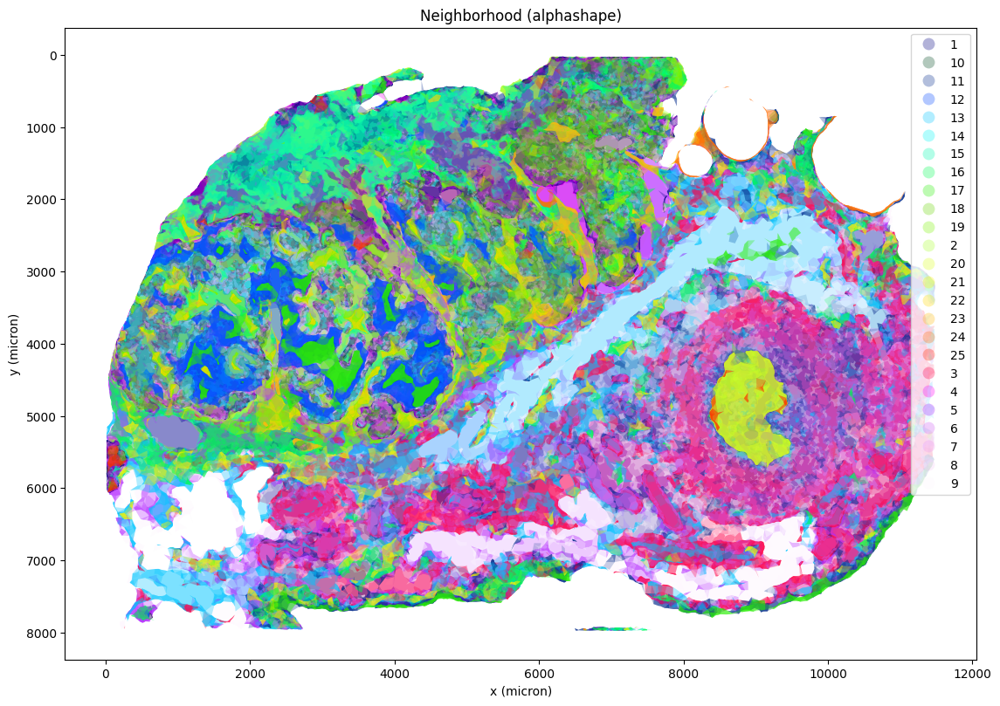

In [47]:
subset_view = False

fig, ax = plt.subplots(figsize=(20,8))
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.1)
gdf_alpha_micron.plot(ax=ax, aspect=1, column='cat', legend=True, cmap='gist_ncar', alpha=0.3)
# gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.9, edgecolor='black', facecolor='none')
ax.invert_yaxis()
plt.title(f"Neighborhood (alphashape)")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
if subset_view:
    plt.xlim(1000, 3000)
    plt.ylim(1400, 2500)
plt.show()

In [48]:
if not os.path.exists(f'{path_landscape_files}/region'):
    os.makedirs(f'{path_landscape_files}/region') # nbhd

gdf_alpha_pixel.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_pixel.parquet', index=False)
gdf_alpha_micron.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_micron.parquet', index=False)

In [49]:
gdf_alpha_pixel.head()

,name,cat,inv_alpha,area,geometry
0,5_350,5,350.0,8.792808e+08,"POLYGON ((170.560 25676.990, 361.800 25821.000..."
1,5_350,5,350.0,8.792808e+08,"POLYGON ((2471.690 36994.140, 2598.070 36922.8..."
2,5_350,5,350.0,8.792808e+08,"POLYGON ((11434.640 14115.290, 11493.870 14215..."
3,5_350,5,350.0,8.792808e+08,"POLYGON ((11856.290 12877.080, 12415.700 12887..."
4,5_350,5,350.0,8.792808e+08,"POLYGON ((40551.550 24966.000, 40205.200 24817..."


In [50]:
gdf_alpha_micron.head()

,name,cat,inv_alpha,area,geometry
0,5_350,5,350.0,8.792808e+08,"POLYGON ((36.244 5456.361, 76.883 5486.963, 17..."
1,5_350,5,350.0,8.792808e+08,"POLYGON ((525.234 7861.255, 552.090 7846.102, ..."
2,5_350,5,350.0,8.792808e+08,"POLYGON ((2429.861 2999.499, 2442.448 3020.760..."
3,5_350,5,350.0,8.792808e+08,"POLYGON ((2519.462 2736.380, 2638.336 2738.605..."
4,5_350,5,350.0,8.792808e+08,"POLYGON ((8617.205 5305.275, 8543.606 5273.753..."
